# Part I: Imports

In [1]:
# Imports
import os
import pandas as pd
import numpy as np
from dotenv import load_dotenv
import alpaca_trade_api as tradeapi
from MCForecastTools import MCSimulation
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import datetime
import hvplot.pandas
import hvplot.dask 
hvplot.extension('plotly')

%matplotlib inline

# Part II: API Data Extraction & Cleansing

In [2]:
# Setting path variable
path = ('/Users/jordanromnes/Downloads/Project_1/keys.env')

In [3]:
# Load .env environment variables
load_dotenv(path)

True

In [4]:
# Setting Alpaca API key and secret
alpaca_api_key = os.getenv("ALPACA_API_KEY")
alpaca_secret_key = os.getenv("ALPACA_SECRET_KEY")

In [5]:
# Creating the Alpaca API object
alpaca = tradeapi.REST(
    alpaca_api_key,
    alpaca_secret_key,
    api_version="v2")

In [6]:
# Setting date range for API data extraction
start_date = pd.Timestamp('2021-01-01', tz='America/New_York').isoformat()
end_date = pd.Timestamp('2024-01-01', tz='America/New_York').isoformat()

In [7]:
# Extracting 3 years worth(1/1/21:1/1/24) of historical data for each stock
timeframe = "1Day"
ticker = ['AAPL', 'JPM', 'META', 'UNP', 'XOM', 'NEE', 'UNH', 'RIO', 'EQIX', 'WMT', 'AMZN']
stocks_df = alpaca.get_bars(
    ticker,
    timeframe,
    start=start_date,
    end=end_date,
    limit=10000
).df

# Cleaning data so only closing stock prices are retrieved
AAPL = stocks_df[stocks_df['symbol']=='AAPL'].drop(['symbol', 'high', 'low', 'trade_count', 'open', 'volume', 'vwap'], axis=1)
JPM = stocks_df[stocks_df['symbol']=='JPM'].drop(['symbol', 'high', 'low', 'trade_count', 'open', 'volume', 'vwap'], axis=1)
META = stocks_df[stocks_df['symbol']=='META'].drop(['symbol', 'high', 'low', 'trade_count', 'open', 'volume', 'vwap'], axis=1)
UNP = stocks_df[stocks_df['symbol']=='UNP'].drop(['symbol', 'high', 'low', 'trade_count', 'open', 'volume', 'vwap'], axis=1)
XOM = stocks_df[stocks_df['symbol']=='XOM'].drop(['symbol', 'high', 'low', 'trade_count', 'open', 'volume', 'vwap'], axis=1)
NEE = stocks_df[stocks_df['symbol']=='NEE'].drop(['symbol', 'high', 'low', 'trade_count', 'open', 'volume', 'vwap'], axis=1)
UNH = stocks_df[stocks_df['symbol']=='UNH'].drop(['symbol', 'high', 'low', 'trade_count', 'open', 'volume', 'vwap'], axis=1)
RIO = stocks_df[stocks_df['symbol']=='RIO'].drop(['symbol', 'high', 'low', 'trade_count', 'open', 'volume', 'vwap'], axis=1)
EQIX = stocks_df[stocks_df['symbol']=='EQIX'].drop(['symbol', 'high', 'low', 'trade_count', 'open', 'volume', 'vwap'], axis=1)
WMT = stocks_df[stocks_df['symbol']=='WMT'].drop(['symbol', 'high', 'low', 'trade_count', 'open', 'volume', 'vwap'], axis=1)
AMZN = stocks_df[stocks_df['symbol']=='AMZN'].drop(['symbol', 'high', 'low', 'trade_count', 'open', 'volume', 'vwap'], axis=1)

# Concatenating the stock DataFrames, adding keys to represent each stock by ticker, renaming axis 'Date'
stocks_df = pd.concat([AAPL, JPM, META, UNP, XOM, NEE, UNH, RIO, EQIX, WMT, AMZN],axis=1, keys=['AAPL', 'JPM', 'META', 'UNP', 'XOM', 'NEE', 'UNH', 'RIO', 'EQIX', 'WMT', 'AMZN'])
stocks_df.rename_axis('Date', inplace=True)
# Display sample data
stocks_df.head()

,AAPL,JPM,META,UNP,XOM,NEE,UNH,RIO,EQIX,WMT,AMZN
,close,close,close,close,close,close,close,close,close,close,close
Date,,,,,,,,,,,
2021-01-04 05:00:00+00:00,129.41,125.87,268.94,203.01,41.50,74.22,349.50,77.39,692.56,146.53,3186.63
2021-01-05 05:00:00+00:00,131.01,125.65,270.97,205.50,43.50,74.77,344.80,79.26,691.54,145.75,3218.51
2021-01-06 05:00:00+00:00,126.66,131.55,263.34,209.80,44.61,78.43,359.27,82.80,668.96,146.66,3138.38
2021-01-07 05:00:00+00:00,130.92,135.87,268.74,212.72,44.96,79.29,365.03,85.98,678.97,146.65,3162.16
2021-01-08 05:00:00+00:00,132.05,136.02,267.57,218.82,45.46,81.13,363.39,86.69,692.46,146.63,3182.70


# Part III: Historical Analysis

## All Stocks Historic Daily Returns

In [8]:
# Calculating all stocks daily returns
stock_daily_returns = stocks_df.pct_change()
# Dropping NAs
stock_daily_returns = stocks_df.pct_change().dropna()
stock_daily_returns.rename(columns={'close': 'Daily Returns'}, inplace=True)
# Showing sample data
stock_daily_returns.head()

,AAPL,JPM,META,UNP,XOM,NEE,UNH,RIO,EQIX,WMT,AMZN
,Daily Returns,Daily Returns,Daily Returns,Daily Returns,Daily Returns,Daily Returns,Daily Returns,Daily Returns,Daily Returns,Daily Returns,Daily Returns
Date,,,,,,,,,,,
2021-01-05 05:00:00+00:00,0.012364,-0.001748,0.007548,0.012265,0.048193,0.007410,-0.013448,0.024163,-0.001473,-0.005323,0.010004
2021-01-06 05:00:00+00:00,-0.033204,0.046956,-0.028158,0.020925,0.025517,0.048950,0.041966,0.044663,-0.032652,0.006244,-0.024897
2021-01-07 05:00:00+00:00,0.033633,0.032839,0.020506,0.013918,0.007846,0.010965,0.016033,0.038406,0.014964,-0.000068,0.007577
2021-01-08 05:00:00+00:00,0.008631,0.001104,-0.004354,0.028676,0.011121,0.023206,-0.004493,0.008258,0.019868,-0.000136,0.006496
2021-01-11 05:00:00+00:00,-0.023249,0.014924,-0.040102,-0.006718,0.030356,-0.017749,-0.007265,-0.033568,-0.014542,0.004501,-0.021519


## Calculations of all portfolios: daily returns, cumulative returns, & historic values

In [9]:
# Setting initial investment of $20,000 for calculating the historical values of each portfolio if $20,000 was initially invested at the start of our data set.
initial_investment = 20000

### Control Portfolio

In [10]:
# Setting Control Portfolio weights
control_weights = [0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09]

# Calculating Control Portfolio daily returns
control_daily_returns = stock_daily_returns.dot(control_weights)

# Calculating control portfolio cumulative returns
control_cumulative_returns = (1 + pd.Series(control_daily_returns)).cumprod()

# Calculating historical value of control portfolio with $20,000 invested at the start of dataframe to the value at the end of dataframe
control_historical_value = initial_investment * control_cumulative_returns

### Technology Portfolio

In [11]:
# Setting weights for Technology Portfolio
tech_weights = [0.25, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075]

# Calculate Technology portfolio return
tech_daily_returns = stock_daily_returns.dot(tech_weights)

# Calculating technology portfolio cumulative returns
tech_cumulative_returns = (1 + pd.Series(tech_daily_returns)).cumprod()

# Calculating historical value of technology portfolio with $20,000 invested at the start of dataframe to the value at the end of dataframe
tech_historical_value = initial_investment * tech_cumulative_returns

### Financial Portfolio

In [12]:
# Set weights for financial portfolio
fin_weights = [0.075, 0.25, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075]

# Calculate financial portfolio return
fin_daily_returns = stock_daily_returns.dot(fin_weights)

# Calculating financial cumulative returns
fin_cumulative_returns = (1 + pd.Series(fin_daily_returns)).cumprod()

# Calculating historical value of financial portfolio with $20,000 invested at the start of dataframe to the value at the end of dataframe
fin_historical_value = initial_investment * fin_cumulative_returns

### Consumer Services Portfolio

In [13]:
# Set weights for consumer services portfolio
con_ser_weights = [0.075, 0.075, 0.25, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075]

# Calculate portfolio return
con_ser_daily_returns = stock_daily_returns.dot(con_ser_weights)

# Calculating cumulative returns
con_ser_cumulative_returns = (1 + pd.Series(con_ser_daily_returns)).cumprod()

# Calculating historical value of consumer services portfolio with $20,000 invested at the start of dataframe to the value at the end of dataframe
con_ser_historical_value = initial_investment * con_ser_cumulative_returns

### Industrial Portfolio

In [14]:
# Set weights
ind_weights = [0.075, 0.075, 0.075, 0.25, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075]

# Calculate portfolio return
ind_daily_returns = stock_daily_returns.dot(ind_weights)

# Calculating cumulative returns
ind_cumulative_returns = (1 + pd.Series(ind_daily_returns)).cumprod()

# Calculating historical value of industrial portfolio with $20,000 invested at the start of dataframe to the value at the end of dataframeind_historical_value = initial_investment * ind_cumulative_returns
ind_historical_value = initial_investment * ind_cumulative_returns

### Energy Portfolio

In [15]:
# Set weights
nrg_weights = [0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075]

# Calculate portfolio return
nrg_daily_returns = stock_daily_returns.dot(nrg_weights)

# Calculating cumulative returns
nrg_cumulative_returns = (1 + pd.Series(nrg_daily_returns)).cumprod()

# Calculating historical value of energy portfolio with $20,000 invested at the start of dataframe to the value at the end of dataframenrg_historical_value = initial_investment * nrg_cumulative_returns
nrg_historical_value = initial_investment * nrg_cumulative_returns

### Utilities Portfolio

In [16]:
# Set weights
util_weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.075, 0.075, 0.075, 0.075]

# Calculate portfolio return
util_daily_returns = stock_daily_returns.dot(util_weights)

# Calculating cumulative returns
util_cumulative_returns = (1 + pd.Series(util_daily_returns)).cumprod()

# Calculating historical value of utilities portfolio with $20,000 invested at the start of dataframe to the value at the end of dataframeutil_historical_value = initial_investment * util_cumulative_returns
util_historical_value = initial_investment * util_cumulative_returns

### Healthcare Portfolio

In [17]:
# Set weights
hc_weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.075, 0.075, 0.075]

# Calculate portfolio return
hc_daily_returns = stock_daily_returns.dot(hc_weights)

# Calculating cumulative returns
hc_cumulative_returns = (1 + pd.Series(hc_daily_returns)).cumprod()

# Calculating historical value of healthcare portfolio with $20,000 invested at the start of dataframe to the value at the end of dataframehc_historical_value = initial_investment * hc_cumulative_returns
hc_historical_value = initial_investment * hc_cumulative_returns

### Materials Portfolio

In [18]:
# Set weights
mat_weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.075, 0.075]

# Calculate portfolio return
mat_daily_returns = stock_daily_returns.dot(mat_weights)

# Calculating cumulative returns
mat_cumulative_returns = (1 + pd.Series(mat_daily_returns)).cumprod()

# Calculating historical value of materials portfolio with $20,000 invested at the start of dataframe to the value at the end of dataframemat_historical_value = initial_investment * mat_cumulative_returns
mat_historical_value = initial_investment * mat_cumulative_returns

### Real Estate Portfolio

In [19]:
# Set weights
re_weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.075]

# Calculate portfolio return
re_daily_returns = stock_daily_returns.dot(re_weights)

# Calculating cumulative returns
re_cumulative_returns = (1 + pd.Series(re_daily_returns)).cumprod()

# Calculating historical value of real estate portfolio with $20,000 invested at the start of dataframe to the value at the end of dataframere_historical_value = initial_investment * re_cumulative_returns
re_historical_value = initial_investment * re_cumulative_returns

### Consumer Staples Portfolio

In [20]:
# Set weights
con_staple_weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075]

# Calculate portfolio return
con_staple_daily_returns = stock_daily_returns.dot(con_staple_weights)

# Calculating cumulative returns
con_staple_cumulative_returns = (1 + pd.Series(con_staple_daily_returns)).cumprod()

# Calculating historical value of consumer staples portfolio with $20,000 invested at the start of dataframe to the value at the end of dataframecon_staple_historical_value = initial_investment * con_staple_cumulative_returns
con_staple_historical_value = initial_investment * con_staple_cumulative_returns

### Consumer Discretionary Portfolio

In [21]:
# Set weights
con_disc_weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.25]

# Calculate portfolio return
con_disc_daily_returns = stock_daily_returns.dot(con_disc_weights)

# Calculating cumulative returns
con_disc_cumulative_returns = (1 + pd.Series(con_disc_daily_returns)).cumprod()

# Calculating historical value of consumer discretionary portfolio with $20,000 invested at the start of dataframe to the value at the end of dataframecon_disc_historical_value = initial_investment * con_disc_cumulative_returns
con_disc_historical_value = initial_investment * con_disc_cumulative_returns

## Concatenation of all portfolio data

### Combining All Historic Values into a single DataFrame

In [22]:
all_historical_values_df = pd.concat([
    control_historical_value, 
    tech_historical_value,
    fin_historical_value,
    con_ser_historical_value,
    ind_historical_value,
    nrg_historical_value,
    util_historical_value,
    hc_historical_value,
    mat_historical_value,
    re_historical_value,
    con_staple_historical_value,
    con_disc_historical_value], keys=['Control', 'Technology', 'Finance', 'Consumer Services', 'Industrial', 'Energy', 'Utilities', 'Healthcare', 'Materials', 'Real Estate', 'Consumer Staples', 'Consumer Discretionary'], axis=1)

### Combining All Cumulative Returns into a single DataFrame

In [23]:
all_cumulative_returns_df = pd.concat([
    control_cumulative_returns, 
    tech_cumulative_returns,
    fin_cumulative_returns,
    con_ser_cumulative_returns,
    ind_cumulative_returns,
    nrg_cumulative_returns,
    util_cumulative_returns,
    hc_cumulative_returns,
    mat_cumulative_returns,
    re_cumulative_returns,
    con_staple_cumulative_returns,
    con_disc_cumulative_returns], keys=['Control', 'Technology', 'Finance', 'Consumer Services', 'Industrial', 'Energy', 'Utilities', 'Healthcare', 'Materials', 'Real Estate', 'Consumer Staples', 'Consumer Discretionary'], axis=1)

### Combining All Daily Returns into a single DataFrame

In [24]:
all_daily_returns_df = pd.concat([
    control_daily_returns, 
    tech_daily_returns,
    fin_daily_returns,
    con_ser_daily_returns,
    ind_daily_returns,
    nrg_daily_returns,
    util_daily_returns,
    hc_daily_returns,
    mat_daily_returns,
    re_daily_returns,
    con_staple_daily_returns,
    con_disc_daily_returns], keys=['Control', 'Technology', 'Finance', 'Consumer Services', 'Industrial', 'Energy', 'Utilities', 'Healthcare', 'Materials', 'Real Estate', 'Consumer Staples', 'Consumer Discretionary'], axis=1)

# Part IV: Risk Analysis

In [25]:
## Use all_returns_df for Risk Analysis
all_portfolio_std = all_daily_returns_df.std()
all_portfolio_std.sort_values()

Consumer Staples          0.010495
Healthcare                0.010574
Industrial                0.011045
Energy                    0.011160
Finance                   0.011163
Control                   0.011185
Utilities                 0.011202
Real Estate               0.011430
Materials                 0.011609
Technology                0.011724
Consumer Services         0.013237
Consumer Discretionary    0.014920
dtype: float64

In [26]:
## Determine which portfolios are riskier
volatility = all_daily_returns_df.std() * np.sqrt(252)
volatility.sort_values()

Consumer Staples          0.166595
Healthcare                0.167854
Industrial                0.175337
Energy                    0.177164
Finance                   0.177203
Control                   0.177557
Utilities                 0.177830
Real Estate               0.181447
Materials                 0.184282
Technology                0.186116
Consumer Services         0.210138
Consumer Discretionary    0.236854
dtype: float64

# Part V: Monte Carlo 5 year simulation with an initial investment of $20,000 for each portfolio

## Control Portfolio

In [27]:
# Configuring a Monte Carlo simulation to forecast 5 years cumulative returns
MC_5_year_control = MCSimulation(
    portfolio_data = stocks_df,
    weights = [0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09],
    num_simulation = 500,
    num_trading_days = 252*5
)

In [28]:
# Running a Monte Carlo simulation to forecast 5 years cumulative returns
MC_5_year_control.calc_cumulative_return()

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.993746,0.998918,1.001402,0.988008,1.008241,1.007847,0.993375,0.995895,0.996161,1.002228,...,0.995975,0.998802,0.998568,0.998698,1.012263,1.002857,1.007193,0.993930,1.011690,0.998311
2,1.009162,0.996034,1.000820,0.986436,0.995334,1.009664,0.978360,1.001625,0.991192,0.992082,...,1.000955,0.994157,0.999061,0.999495,1.000993,1.009502,1.005386,0.984667,1.006125,0.989739
3,1.007282,1.002292,1.001187,0.987734,1.001716,1.007814,0.976311,0.999013,0.981750,0.991183,...,0.995568,0.989257,0.998096,0.985976,0.997476,1.001976,1.009695,0.988234,1.012011,0.987006
4,1.006435,1.002772,0.989840,0.997118,1.000889,1.009230,0.971150,0.998858,0.968879,0.988832,...,0.999917,0.985423,0.993931,0.979378,0.995309,1.008677,0.998219,0.988709,1.005838,0.977693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,0.934058,2.153238,1.755930,1.150545,1.799633,1.177268,1.638948,1.334485,1.733569,1.798038,...,1.695824,1.392593,1.535393,1.205579,1.155120,1.195112,1.327015,1.038701,1.006325,1.894786
1257,0.937435,2.160434,1.770285,1.144232,1.801357,1.178731,1.645664,1.333013,1.750555,1.811404,...,1.709015,1.384585,1.545828,1.205181,1.155485,1.211439,1.330698,1.035239,1.016980,1.893321
1258,0.945712,2.178049,1.771681,1.142768,1.814932,1.180857,1.653537,1.343291,1.774163,1.819367,...,1.728104,1.375549,1.535326,1.222155,1.159951,1.222243,1.317415,1.042821,1.022692,1.882268
1259,0.942858,2.180137,1.780820,1.139261,1.813877,1.154130,1.637781,1.335142,1.768971,1.827461,...,1.720867,1.382278,1.534927,1.201562,1.162255,1.213224,1.324708,1.048583,1.026193,1.877593


In [29]:
# Fetch summary statistics from the Monte Carlo simulation results
five_year_summary_control = MC_5_year_control.summarize_cumulative_return()

## Technology Portfolio

In [30]:
MC_5_year_tech = MCSimulation(
    portfolio_data = stocks_df,
    weights = [0.25, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075],
    num_simulation = 500,
    num_trading_days = 252*5
)

In [31]:
# Running a Monte Carlo simulation to forecast 5 years cumulative returns
MC_5_year_tech.calc_cumulative_return()

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.991191,0.997735,1.019141,0.996391,1.011404,1.004384,1.010061,0.996232,0.991263,1.003509,...,0.998622,1.009530,1.001598,0.999744,1.013565,1.010721,1.000882,0.997723,0.982959,0.984847
2,0.983097,0.997078,1.024959,1.007045,1.022080,1.013100,0.999564,0.998284,0.988728,1.012927,...,0.993029,1.006748,1.009083,0.993513,1.013463,1.007617,1.003289,0.998714,0.985499,0.990090
3,0.989088,1.014630,1.023295,1.004802,1.024535,1.020400,0.996072,1.008272,0.987646,1.013243,...,1.000568,1.010661,1.010075,0.997828,1.020142,1.012115,1.001747,1.003349,0.991262,0.996334
4,0.978909,1.031645,1.022836,0.998999,1.016080,1.017355,0.992644,1.009293,0.980329,1.008376,...,1.008963,1.016720,1.005011,0.994005,1.035820,1.012770,1.007397,1.010647,0.989244,1.007252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,1.502656,1.723699,2.203878,1.349726,1.430932,1.696672,2.081596,1.623327,1.411604,1.552187,...,1.510592,1.000008,1.151474,1.715862,1.944260,1.264789,1.935273,2.418670,1.389796,1.677678
1257,1.505170,1.718308,2.201289,1.343617,1.427977,1.686210,2.090481,1.626279,1.388506,1.556014,...,1.511978,0.997755,1.163575,1.714378,1.957082,1.261978,1.942007,2.435603,1.375938,1.677619
1258,1.507838,1.701989,2.228787,1.333261,1.430481,1.692564,2.096451,1.619545,1.397662,1.549143,...,1.531876,1.011359,1.158033,1.724736,1.976135,1.269213,1.931115,2.439515,1.358053,1.687780
1259,1.515323,1.717587,2.217975,1.332117,1.425584,1.682207,2.100480,1.619452,1.390042,1.533833,...,1.531110,1.012221,1.147204,1.736342,1.970939,1.271846,1.925942,2.451001,1.362575,1.674567


In [32]:
# Fetch summary statistics from the Monte Carlo simulation results
five_year_summary_tech = MC_5_year_tech.summarize_cumulative_return()

## Financial Portfolio

In [33]:
MC_5_year_fin = MCSimulation(
    portfolio_data = stocks_df,
    weights = [0.075, 0.25, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075],
    num_simulation = 500,
    num_trading_days = 252*5
)

In [34]:
# Running a Monte Carlo simulation to forecast 5 years cumulative returns
MC_5_year_fin.calc_cumulative_return()

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.007268,0.996767,0.998363,0.994834,1.001061,0.994054,1.008774,1.001746,1.008903,1.005918,...,0.996729,1.001720,1.010009,0.990385,1.006554,1.008186,1.006536,1.012076,0.993864,0.992643
2,1.003078,0.999824,1.001749,0.994760,1.002078,0.999824,1.007929,0.999272,1.012130,1.005561,...,0.995750,0.995584,1.013183,0.983496,1.014139,1.017320,0.991472,1.007235,0.994276,0.986992
3,0.989587,1.012839,1.000814,0.999821,1.011586,0.997227,1.002532,0.993314,1.021093,1.007152,...,0.981562,1.008629,1.025329,0.981892,1.015454,1.006611,0.996780,1.017702,0.990860,0.986232
4,0.992057,1.016208,1.007023,0.999425,1.021474,1.000885,0.987005,0.995224,1.038229,1.011218,...,0.973062,1.012909,1.031688,0.983277,1.016795,1.007728,1.002797,1.017043,0.985865,0.979099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,1.051000,1.361691,0.989719,1.534936,1.801219,1.498857,1.218515,1.918201,1.455133,1.313361,...,1.301342,0.831171,1.722598,1.618102,1.493178,1.651903,1.081107,1.160112,1.548006,1.515614
1257,1.053127,1.363250,0.989253,1.547964,1.792193,1.494985,1.217548,1.911277,1.443670,1.300409,...,1.314356,0.827905,1.731305,1.634570,1.492680,1.656382,1.086147,1.174274,1.537291,1.508867
1258,1.055221,1.346459,0.987495,1.559236,1.800362,1.482511,1.203476,1.932270,1.443550,1.307983,...,1.322617,0.834525,1.728876,1.630169,1.493818,1.662127,1.081846,1.179643,1.534271,1.519218
1259,1.046797,1.358110,0.977562,1.543996,1.801825,1.495631,1.194282,1.943425,1.428113,1.312626,...,1.323204,0.825606,1.753327,1.635292,1.493156,1.661997,1.083865,1.181583,1.521023,1.521484


In [35]:
# Fetch summary statistics from the Monte Carlo simulation results
five_year_summary_fin = MC_5_year_fin.summarize_cumulative_return()

## Consumer Services Portfolio

In [36]:
MC_5_year_con_ser = MCSimulation(
    portfolio_data = stocks_df,
    weights = [0.075, 0.075, 0.25, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075],
    num_simulation = 500,
    num_trading_days = 252*5
)

In [37]:
# Running a Monte Carlo simulation to forecast 5 years cumulative returns
MC_5_year_con_ser.calc_cumulative_return()

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.993369,0.998881,0.997421,0.997346,0.989784,1.017140,0.986610,0.997619,0.997121,1.028038,...,0.998147,1.015787,0.993735,1.002449,1.005532,1.001474,1.000082,0.987517,1.001964,1.010336
2,0.994327,0.997047,1.000581,0.996388,0.987683,1.008510,0.977885,1.009455,0.990328,1.027889,...,0.979782,1.025054,0.998910,1.007010,1.010437,0.987641,1.000506,0.986576,1.001440,1.014097
3,0.977951,0.993291,1.000919,1.004720,0.991506,1.011448,0.976982,1.022490,0.995328,1.025922,...,0.984774,1.023912,0.991205,1.023072,1.012478,0.985544,0.994513,0.981961,0.984680,1.019596
4,0.976934,1.001536,0.994569,1.002130,0.991285,1.023995,0.981724,1.023354,0.990560,1.012085,...,0.981079,1.012438,0.989622,1.013223,1.011054,0.982357,0.989674,0.989500,0.964939,1.011212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,1.192571,1.978997,2.637916,1.799408,2.014439,2.439409,1.905376,1.434606,0.840483,1.541849,...,2.133363,1.107359,1.709256,1.498772,1.347815,1.890351,1.561563,1.959725,3.355363,1.808777
1257,1.218426,1.984232,2.631622,1.787825,2.050465,2.472742,1.896728,1.418193,0.847528,1.544411,...,2.138686,1.114172,1.713105,1.500659,1.355892,1.912750,1.563834,1.980167,3.348102,1.825144
1258,1.215700,2.002776,2.635642,1.771616,2.071601,2.508980,1.891421,1.425555,0.831858,1.556816,...,2.124056,1.122758,1.705430,1.487112,1.354061,1.915552,1.543203,1.985052,3.315867,1.810060
1259,1.210972,1.991156,2.665369,1.790051,2.091118,2.523618,1.900190,1.406448,0.825368,1.556076,...,2.130229,1.121601,1.688446,1.483315,1.338993,1.932110,1.566857,1.985589,3.322233,1.808009


In [38]:
# Fetch summary statistics from the Monte Carlo simulation results
five_year_summary_con_ser = MC_5_year_con_ser.summarize_cumulative_return()

## Industrial Portfolio

In [39]:
MC_5_year_ind= MCSimulation(
    portfolio_data = stocks_df,
    weights = [0.075, 0.075, 0.075, 0.25, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075],
    num_simulation = 500,
    num_trading_days = 252*5
)

In [40]:
# Running a Monte Carlo simulation to forecast 5 years cumulative returns
MC_5_year_ind.calc_cumulative_return()

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.998190,1.003905,1.008671,0.994343,0.993274,1.004939,0.990606,0.984878,1.003196,0.998411,...,1.000330,0.999322,1.001521,1.001469,0.998841,0.993227,0.998138,0.993785,1.006559,0.997276
2,0.998026,1.008180,1.005934,0.990017,0.997197,1.002716,0.990617,0.986376,1.008659,0.995714,...,0.992252,1.011085,1.011458,1.006288,0.994661,0.994723,0.995033,0.998884,1.013242,0.997046
3,0.994660,0.999163,1.007649,1.001792,1.010408,1.004299,0.991127,0.988791,1.017309,1.004964,...,1.006246,1.007650,1.013499,0.995569,0.991323,0.988936,1.000505,1.007222,1.014890,0.998771
4,0.995080,0.996629,1.010290,1.000158,1.012733,0.994428,1.002223,1.000774,1.022350,1.008430,...,1.006470,0.999886,1.017338,0.997112,0.996317,0.995120,0.993556,1.018446,1.014906,0.991901
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,1.707156,1.171758,1.654341,2.021882,1.479335,1.214291,1.400093,1.467900,1.886169,1.318861,...,1.807171,1.414095,1.221286,1.999022,1.318631,1.038734,1.057606,1.285680,1.264920,1.469982
1257,1.695649,1.163739,1.648976,2.016185,1.493559,1.226940,1.403388,1.466097,1.889727,1.306174,...,1.800174,1.406755,1.226229,1.991367,1.329354,1.036900,1.059532,1.279706,1.261406,1.463403
1258,1.690147,1.170659,1.644537,2.018787,1.502751,1.236861,1.407165,1.462231,1.888750,1.309287,...,1.807711,1.411838,1.219390,2.013522,1.320528,1.033078,1.060860,1.270164,1.260212,1.456960
1259,1.681823,1.167043,1.651704,2.014414,1.510501,1.244746,1.403721,1.461916,1.866645,1.329736,...,1.811899,1.413971,1.220577,2.007604,1.308709,1.039188,1.056532,1.275914,1.251890,1.460199


In [41]:
# Fetch summary statistics from the Monte Carlo simulation results
five_year_summary_ind = MC_5_year_ind.summarize_cumulative_return()

## Energy Portfolio

In [42]:
MC_5_year_nrg = MCSimulation(
    portfolio_data = stocks_df,
    weights = [0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075],
    num_simulation = 500,
    num_trading_days = 252*5
)

In [43]:
# Running a Monte Carlo simulation to forecast 5 years cumulative returns
MC_5_year_nrg.calc_cumulative_return()

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.995330,1.003384,1.012732,1.009807,1.005101,1.001947,1.000666,1.002499,1.018888,1.006416,...,0.999151,0.998514,0.999545,1.011350,0.986332,1.003920,0.998398,1.008536,1.004848,1.019834
2,0.989717,0.995114,1.016865,0.992933,1.001997,0.994065,0.994833,1.011454,1.005983,1.009940,...,1.008626,0.997461,0.995125,1.002717,0.977458,1.009410,0.996932,1.015452,1.005967,1.021313
3,0.989495,0.983856,1.025798,1.001013,1.000509,0.998621,0.994674,1.005819,0.999999,1.001692,...,1.001298,0.992307,0.996991,1.008389,0.978866,1.006820,1.003181,1.014080,1.006842,1.022024
4,0.987554,0.990436,1.029074,1.009272,1.008043,1.011053,0.983950,1.000353,1.001211,1.002753,...,0.988417,0.989990,1.000419,0.998534,0.981716,1.012039,1.012645,1.012493,1.003993,1.021722
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,1.958269,2.179978,2.610468,2.104595,1.390188,1.874354,1.483391,1.363067,2.059911,1.834135,...,1.635196,1.247270,1.382019,1.201452,2.185181,1.900968,1.965111,2.122396,2.649209,2.022747
1257,1.935694,2.171387,2.623484,2.082109,1.370840,1.887734,1.494627,1.365768,2.039251,1.817801,...,1.635709,1.252373,1.382892,1.212119,2.209265,1.901087,1.970358,2.105508,2.639237,2.021128
1258,1.940918,2.177061,2.597692,2.085957,1.378918,1.887883,1.471736,1.365359,2.033638,1.803687,...,1.633515,1.260910,1.369883,1.225514,2.215219,1.885115,1.953906,2.095754,2.616278,2.024850
1259,1.943504,2.185019,2.609558,2.085254,1.356669,1.929486,1.476024,1.355804,2.015368,1.787676,...,1.635365,1.258845,1.373387,1.199428,2.212728,1.888085,1.945291,2.102498,2.617631,2.028591


In [44]:
# Fetch summary statistics from the Monte Carlo simulation results
five_year_summary_nrg = MC_5_year_nrg.summarize_cumulative_return()

## Utilities Portfolio

In [45]:
MC_5_year_util = MCSimulation(
    portfolio_data = stocks_df,
    weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.075, 0.075, 0.075, 0.075],
    num_simulation = 500,
    num_trading_days = 252*5
)

In [46]:
# Running a Monte Carlo simulation to forecast 5 years cumulative returns
MC_5_year_util.calc_cumulative_return()

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.000207,1.006579,0.998649,0.998887,0.998314,1.001919,0.989748,1.003688,1.000265,1.004552,...,1.001186,0.995350,1.008286,0.998461,0.994238,1.005893,1.005471,1.005428,1.002845,0.990094
2,1.003221,1.014488,0.997424,0.998503,0.985792,0.984610,0.985489,1.016871,1.003557,1.012432,...,0.996710,0.981897,1.017713,0.984300,0.990161,1.012120,1.004255,0.999367,1.004188,0.987646
3,1.009060,1.003317,1.002281,1.004017,0.988929,0.974219,0.976798,1.019747,1.010975,1.004528,...,0.985393,0.979657,1.013312,0.983995,0.985091,1.005651,1.012442,1.005814,1.003862,0.988614
4,1.013542,1.001451,0.997518,1.011939,0.984213,0.971682,0.974564,1.022928,1.008086,1.013509,...,0.990120,0.989858,1.011044,0.993650,0.987797,1.004591,1.008980,1.017314,0.992545,0.990561
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,1.445580,1.546008,1.280298,1.098304,1.449552,1.816963,1.233623,1.118286,1.966061,1.450517,...,1.232843,1.375483,1.592214,1.359353,1.292355,0.950075,1.023197,1.250310,1.446460,1.685662
1257,1.452934,1.549121,1.292677,1.109823,1.447660,1.812520,1.241715,1.120860,1.980870,1.457258,...,1.235600,1.367459,1.592945,1.372561,1.293254,0.956179,1.024926,1.261743,1.443365,1.694090
1258,1.451830,1.556419,1.288987,1.105691,1.434917,1.801682,1.261144,1.115012,1.995301,1.466386,...,1.245259,1.378996,1.586189,1.384870,1.307031,0.967318,1.028011,1.257472,1.433367,1.700967
1259,1.455014,1.572706,1.286732,1.093365,1.440666,1.821884,1.255776,1.110584,1.956845,1.453425,...,1.242897,1.379253,1.588360,1.395713,1.304537,0.953069,1.029509,1.245765,1.438513,1.687184


In [47]:
# Fetch summary statistics from the Monte Carlo simulation results
five_year_summary_util = MC_5_year_util.summarize_cumulative_return()

## Healthcare Portfolio

In [48]:
MC_5_year_hc = MCSimulation(
    portfolio_data = stocks_df,
    weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.075, 0.075, 0.075],
    num_simulation = 500,
    num_trading_days = 252*5
)

In [49]:
# Running a Monte Carlo simulation to forecast 5 years cumulative returns
MC_5_year_hc.calc_cumulative_return()

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.995014,1.002189,1.008565,0.992779,0.998666,0.990824,0.992239,1.008814,1.002157,1.001606,...,0.989425,1.000042,1.010892,1.000052,1.007629,0.997496,1.006020,0.996307,0.995867,0.997810
2,0.990456,0.991361,1.013640,0.996991,1.006531,0.992902,0.993340,1.006608,1.004004,1.007299,...,0.997434,0.997871,1.016411,1.009740,1.012160,1.000421,0.992993,0.994707,0.993909,1.007350
3,0.985580,0.988616,1.009461,1.002876,1.002786,0.985814,0.988900,1.003816,1.010354,1.007362,...,1.005342,1.002856,1.022447,1.008062,1.020765,0.996329,0.997579,0.995872,1.001200,1.011480
4,0.992750,0.995561,1.005828,1.006927,1.006918,0.977157,0.993278,1.005911,1.003741,1.012680,...,1.013659,1.007345,1.023047,1.010563,1.031774,0.999489,0.992617,0.991728,1.002442,1.017850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,1.693230,1.248543,1.895258,1.140457,2.177292,1.238859,2.056504,1.227024,2.009251,1.555768,...,1.528613,1.155056,1.272630,2.495201,1.385823,1.830922,1.408906,2.143237,1.253563,1.627782
1257,1.687530,1.248360,1.893477,1.132800,2.178942,1.233095,2.029234,1.228539,1.995176,1.558624,...,1.537778,1.152338,1.275450,2.514914,1.386553,1.827768,1.414360,2.123127,1.249445,1.613380
1258,1.688408,1.253636,1.912026,1.125915,2.178518,1.241824,2.026828,1.234217,1.998979,1.565388,...,1.543560,1.150717,1.266882,2.529469,1.375404,1.839539,1.405441,2.146918,1.252392,1.597512
1259,1.700696,1.257553,1.888178,1.130914,2.185008,1.240975,2.029473,1.217103,2.030553,1.562274,...,1.558259,1.156739,1.254980,2.535212,1.364815,1.851012,1.397889,2.112846,1.256370,1.590824


In [50]:
# Fetch summary statistics from the Monte Carlo simulation results
five_year_summary_hc = MC_5_year_hc.summarize_cumulative_return()


## Materials Portfolio

In [51]:
MC_5_year_mat = MCSimulation(
    portfolio_data = stocks_df,
    weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.075, 0.075],
    num_simulation = 500,
    num_trading_days = 252*5
)

In [52]:
# Running a Monte Carlo simulation to forecast 5 years cumulative returns
MC_5_year_mat.calc_cumulative_return()

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.010470,1.013420,0.994342,0.997624,0.993989,1.009488,1.002055,0.989030,0.983598,1.005223,...,1.002518,0.994379,0.997910,0.993134,1.000317,0.992089,1.010983,0.996485,1.006243,1.000506
2,1.013343,1.029274,0.999421,0.997701,0.998106,1.028115,0.998593,0.984294,0.992611,0.997813,...,1.006798,0.995335,0.997935,0.989592,0.990737,0.992462,1.004462,0.984639,1.017976,0.994170
3,1.012082,1.044103,1.006270,0.996244,0.992389,1.030149,0.998011,0.985016,0.987783,1.001006,...,1.011374,0.999328,1.004268,0.981950,0.995393,0.989216,1.003691,0.978412,1.018018,1.006670
4,1.018789,1.039987,1.008231,1.011814,0.999475,1.020940,0.999438,0.976777,0.988805,0.990637,...,1.010406,1.004561,0.995893,0.991327,0.989157,0.992934,1.004750,0.978488,1.034346,1.017093
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,1.190017,1.140696,1.007503,1.304663,1.498837,1.593093,2.080728,1.440670,1.923883,1.716815,...,1.609087,1.737034,3.467699,1.543194,2.437374,1.478540,1.416659,1.147194,1.710714,1.733086
1257,1.204847,1.148349,1.024266,1.315580,1.499697,1.565912,2.099493,1.445671,1.904652,1.724492,...,1.618841,1.741405,3.476214,1.527868,2.450827,1.467644,1.423385,1.144115,1.705677,1.728337
1258,1.210447,1.144299,1.013147,1.312207,1.492938,1.569347,2.128166,1.433298,1.902493,1.755731,...,1.628968,1.713737,3.478598,1.547197,2.443058,1.468297,1.410783,1.152807,1.692660,1.741814
1259,1.196474,1.154922,1.030136,1.303190,1.497275,1.576601,2.114494,1.419798,1.902405,1.772003,...,1.629135,1.715394,3.507213,1.566658,2.434529,1.479450,1.429114,1.172672,1.700871,1.724985


In [53]:
# Fetch summary statistics from the Monte Carlo simulation results
five_year_summary_mat = MC_5_year_mat.summarize_cumulative_return()

## Real Estate Portfolio

In [54]:
MC_5_year_re = MCSimulation(
    portfolio_data = stocks_df,
    weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.075],
    num_simulation = 500,
    num_trading_days = 252*5
)


In [55]:
# Running a Monte Carlo simulation to forecast 5 years cumulative returns
MC_5_year_re.calc_cumulative_return()

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.994357,1.004242,0.991664,0.998337,0.986208,0.998821,0.991669,0.993840,1.004832,0.999705,...,1.008086,1.000375,1.002556,0.996718,1.006781,1.007520,0.993883,0.998962,1.001981,1.008133
2,0.982491,1.000470,0.994571,0.997881,0.980972,1.001916,0.997632,1.011115,1.004417,0.999093,...,1.020163,1.001423,1.002278,0.999366,1.000027,1.012731,0.988273,1.002683,1.004090,0.996383
3,0.973658,1.003873,0.984137,0.993622,0.982877,1.006449,1.006112,1.016973,1.022080,0.998734,...,1.020675,1.004636,0.995574,1.001968,0.985654,1.004361,0.989902,0.988342,1.020505,0.991221
4,0.982328,1.006725,0.981441,0.996817,0.983351,1.008464,1.008163,1.025917,1.024572,0.999362,...,1.016466,0.991393,0.997639,0.989622,0.980301,1.005865,0.989406,0.994743,1.013765,0.983424
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,1.254225,0.832439,1.552151,1.483324,1.088065,1.799309,1.641166,1.423853,1.573067,0.997020,...,2.177187,1.012730,1.705608,1.341201,1.238318,1.323583,2.333065,2.132067,0.966642,1.228155
1257,1.250242,0.833516,1.539980,1.485084,1.092597,1.801727,1.651967,1.415072,1.585195,0.997404,...,2.180798,1.015715,1.697346,1.343097,1.243094,1.313759,2.327116,2.135167,0.965454,1.217214
1258,1.238180,0.833929,1.529798,1.483575,1.097522,1.796241,1.655229,1.422043,1.564775,0.996952,...,2.199200,1.019752,1.689342,1.343168,1.247582,1.313667,2.313307,2.134298,0.965940,1.212680
1259,1.239518,0.828218,1.528007,1.489214,1.099456,1.816217,1.659154,1.430492,1.559609,0.990098,...,2.192523,1.016658,1.694618,1.362881,1.250411,1.294729,2.321406,2.153592,0.967699,1.208123


In [56]:
# Fetch summary statistics from the Monte Carlo simulation results
five_year_summary_re = MC_5_year_re.summarize_cumulative_return()

## Consumer Staples Portfolio

In [57]:
MC_5_year_con_staple = MCSimulation(
    portfolio_data = stocks_df,
    weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075],
    num_simulation = 500,
    num_trading_days = 252*5
)

In [58]:
# Running a Monte Carlo simulation to forecast 5 years cumulative returns
MC_5_year_con_staple.calc_cumulative_return()

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.001661,1.009299,0.998074,0.991470,1.004219,1.002977,1.002621,1.005376,1.001181,1.000909,...,1.012494,1.002427,1.002157,1.000504,1.005921,1.002884,0.998898,1.005272,1.002865,0.997844
2,1.008442,1.011628,1.002331,0.990258,1.008260,1.009411,0.995254,1.011545,1.005872,1.010020,...,1.016112,1.008778,1.005554,0.994212,0.996955,1.006001,0.999905,1.004218,0.989425,0.979410
3,1.011769,1.008963,1.003406,0.999435,1.007359,1.014489,0.999918,1.007316,1.003825,1.020412,...,1.013406,1.018606,1.008473,0.990823,0.990497,1.006588,0.997926,0.999870,0.981575,0.967264
4,1.013174,1.006227,1.005779,1.008059,1.008190,1.014226,1.010725,1.021920,0.999928,1.017007,...,1.003444,1.034179,1.009276,0.985006,0.986729,1.004376,0.986048,1.008360,0.985961,0.965272
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,1.737595,1.287621,1.635552,1.687026,1.532572,1.113568,0.991730,1.347571,1.166488,1.128652,...,1.493213,0.963125,1.069522,2.093152,1.277014,0.913394,1.465332,1.472554,1.246657,1.219695
1257,1.744452,1.292024,1.631027,1.691313,1.516389,1.117446,1.003927,1.350180,1.165737,1.130765,...,1.501461,0.967250,1.062225,2.078863,1.268037,0.919822,1.484417,1.469166,1.248444,1.230802
1258,1.734765,1.287661,1.640756,1.709320,1.504961,1.121481,1.009974,1.351189,1.171924,1.132853,...,1.501915,0.966566,1.069343,2.093882,1.268381,0.918891,1.492458,1.463523,1.252715,1.234725
1259,1.728129,1.281953,1.642338,1.704439,1.515215,1.126449,1.019273,1.346379,1.166160,1.134690,...,1.501255,0.975131,1.065322,2.114824,1.262569,0.913805,1.485044,1.456082,1.249763,1.242323


In [59]:
# Fetch summary statistics from the Monte Carlo simulation results
five_year_summary_con_staple = MC_5_year_con_staple.summarize_cumulative_return()

## Consumer Discretionary Portfolio

In [60]:
MC_5_year_con_disc = MCSimulation(
    portfolio_data = stocks_df,
    weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.25],
    num_simulation = 500,
    num_trading_days = 252*5
)

In [61]:
# Running a Monte Carlo simulation to forecast 5 years cumulative returns
MC_5_year_con_disc.calc_cumulative_return()

,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.013413,1.005644,0.990352,1.001172,1.017248,1.022978,1.003327,1.003158,0.995787,0.999056,...,0.979021,1.010862,1.008420,1.001657,0.985150,1.028625,1.014103,0.990728,1.017639,0.991838
2,1.011764,1.017172,0.985419,0.985063,1.028583,1.009418,0.992435,1.002151,1.000153,0.957464,...,1.013084,1.021386,1.026077,1.008113,0.978724,1.010655,1.016903,1.007297,1.016189,0.997697
3,1.034576,1.023092,0.985160,0.993689,1.031700,1.013802,0.993106,0.997244,1.011780,0.950315,...,1.028649,1.027129,1.020992,1.028214,0.965359,1.017217,1.015113,1.028871,1.014123,0.999880
4,1.075706,1.024950,1.015294,1.009203,1.017531,1.029541,0.999725,1.017644,1.009281,0.941531,...,1.038804,1.029431,1.013278,1.039062,0.943990,1.031136,1.018093,1.025849,1.022675,1.010805
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,1.257434,1.027402,0.748486,0.408448,1.439744,0.465672,0.931718,2.469095,1.455556,0.824159,...,1.429481,0.754548,0.804230,0.801543,1.055791,1.992927,0.730454,1.508217,1.004859,1.530019
1257,1.254307,1.009290,0.738909,0.413132,1.455742,0.469572,0.933736,2.491523,1.487941,0.814990,...,1.425860,0.742331,0.785266,0.807006,1.061378,2.000679,0.724623,1.517788,0.995322,1.536061
1258,1.278614,1.010218,0.732325,0.405397,1.456993,0.468990,0.922951,2.527778,1.477900,0.813495,...,1.404247,0.732914,0.791081,0.786340,1.067853,2.048882,0.727873,1.536806,0.992509,1.511321
1259,1.288281,1.007742,0.726909,0.396450,1.455387,0.456961,0.923689,2.557764,1.480504,0.806159,...,1.407650,0.729539,0.787286,0.782298,1.075968,2.075537,0.729049,1.570748,1.007883,1.530089


In [62]:
# Fetch summary statistics from the Monte Carlo simulation results
five_year_summary_con_disc = MC_5_year_con_disc.summarize_cumulative_return()

# Part VI: Plots/Visualizations

## Dataframe created comprised of all portfolio weights

In [63]:
control_weights = [0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09, 0.09]
tech_weights = [0.25, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075]
fin_weights = [0.075, 0.25, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075]
con_ser_weights = [0.075, 0.075, 0.25, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075]
ind_weights = [0.075, 0.075, 0.075, 0.25, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075]
nrg_weights = [0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075]
util_weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.075, 0.075, 0.075, 0.075]
hc_weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.075, 0.075, 0.075]
mat_weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.075, 0.075]
re_weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075, 0.075]
con_staple_weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.25, 0.075]
con_disc_weights = [0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.075, 0.25]
stocks = ['AAPL', 'JPM', 'META', 'UNP', 'XOM', 'NEE', 'UNH', 'RIO', 'EQIX', 'WMT', 'AMZN']
weights_df = pd.DataFrame({
    'Stock Ticker': stocks,
    'Control Portfolio Weights': control_weights,
    'Technology Portfolio Weights': tech_weights, 
    'Financial Portfolio Weights': fin_weights, 
    'Consumer Services Portfolio Weights': con_ser_weights, 
    'Industrial Portfolio Weights': ind_weights, 
    'Energy Portfolio Weights': nrg_weights, 
    'Utilities Portfolio Weights': util_weights,
    'Healthcare Portfolio Weights': hc_weights,
    'Materials Portfolio Weights': mat_weights, 
    'Real Estate Portfolio Weights': re_weights, 
    'Consumer Staples Portfolio Weights': con_staple_weights, 
    'Consumer Discretionary Portfolio Weights': con_disc_weights,
})

weights_df.set_index('Stock Ticker', inplace=True)
weights_df.head()


,Control Portfolio Weights,Technology Portfolio Weights,Financial Portfolio Weights,Consumer Services Portfolio Weights,Industrial Portfolio Weights,Energy Portfolio Weights,Utilities Portfolio Weights,Healthcare Portfolio Weights,Materials Portfolio Weights,Real Estate Portfolio Weights,Consumer Staples Portfolio Weights,Consumer Discretionary Portfolio Weights
Stock Ticker,,,,,,,,,,,,
AAPL,0.09,0.250,0.075,0.075,0.075,0.075,0.075,0.075,0.075,0.075,0.075,0.075
JPM,0.09,0.075,0.250,0.075,0.075,0.075,0.075,0.075,0.075,0.075,0.075,0.075
META,0.09,0.075,0.075,0.250,0.075,0.075,0.075,0.075,0.075,0.075,0.075,0.075
UNP,0.09,0.075,0.075,0.075,0.250,0.075,0.075,0.075,0.075,0.075,0.075,0.075
XOM,0.09,0.075,0.075,0.075,0.075,0.250,0.075,0.075,0.075,0.075,0.075,0.075


## Dataframe created with all summary statistics of each portfolio from the Monte Carlo Simulation

In [64]:
#summary statistics data from MC summary stats
summary_data = {
    'Portfolio': ['Control Portfolio', 'Technology Portfolio', 'Financial Portfolio', 'Consumer Services Portfolio', 'Industrial Portfolio', 'Energy Portfolio', 'Utilities Portfolio', 'Healthcare Portfolio', 'Materials Portfolio', 'Real Estate Portfolio', 'Consumer Staples Portfolio', 'Consumer Discretionary Portfolio'],
    'Count': [500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500],
    'Mean': [1.545391, 1.659857, 1.615429, 1.740296, 1.578976, 1.952880, 1.427392, 1.672034, 1.499294, 1.544857, 1.523139, 1.255082],
    'Std': [0.358682, 0.372502, 0.367757, 0.543870, 0.365985, 0.469835, 0.334997, 0.394731, 0.387952, 0.378868, 0.340528, 0.550978],
    'Min': [0.703196, 0.870358, 0.664177, 0.752176, 0.788292, 0.776112, 0.502422, 0.832961, 0.726631, 0.746463, 0.787898, 0.377275],
    '25%': [1.277155, 1.391495, 1.339905, 1.353373, 1.311028, 1.607052, 1.191671, 1.391577, 1.205730, 1.261457, 1.282223, 0.859306],
    '50%': [1.505098, 1.621650, 1.574458, 1.640123, 1.548915, 1.894041, 1.390096, 1.622487, 1.452233, 1.502943, 1.475149, 1.154307],
    '75%': [1.773814, 1.892591, 1.832107, 2.091901, 1.808063, 2.217046, 1.624966, 1.891133, 1.722245, 1.763815, 1.712802, 1.563726],
    'Max': [3.242164, 2.958406, 3.257708, 4.233898, 2.950851, 3.666983, 2.805759, 3.104243, 3.211989, 3.529010, 3.012248, 3.989297],
    '95% CI Lower': [0.978377, 1.039767, 1.039084, 0.948574, 0.982911, 1.214852, 0.887621, 0.991597, 0.915699, 0.954109, 0.983309, 0.479429],
    '95% CI Upper': [2.296405, 2.450768, 2.495551, 2.986681, 2.390296, 2.997150, 2.169756, 2.582875, 2.345870, 2.403055, 2.349423, 2.602098],
}

# Create DataFrame
all_mc_summary_stats = pd.DataFrame(summary_data)

## Bar Chart to display portfolio weights

### With Plotly

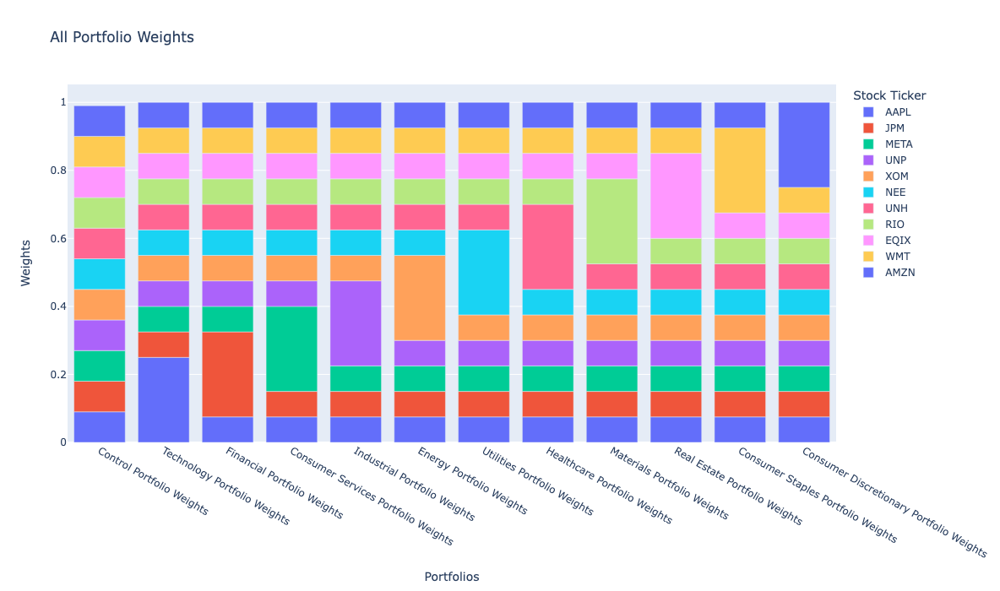

In [65]:
weights_df_fig = px.bar(weights_df.transpose(), labels={'value': 'Weights', 'index':'Portfolios'}, title='All Portfolio Weights', width=900, height=700)
weights_df_fig.show()

### With hvPlot

In [66]:
stacked_bar_plot = weights_df.transpose().hvplot.bar(
    stacked=True, 
    title='Portfolio Weights', 
    xlabel='Portfolios', 
    ylabel='Weights', 
    width=900, 
    height=600
)

# Show the plot
stacked_bar_plot

:Bars   [index,Stock Ticker]   (value)

## Historic 3 year Cumulative Returns

### With Plotly

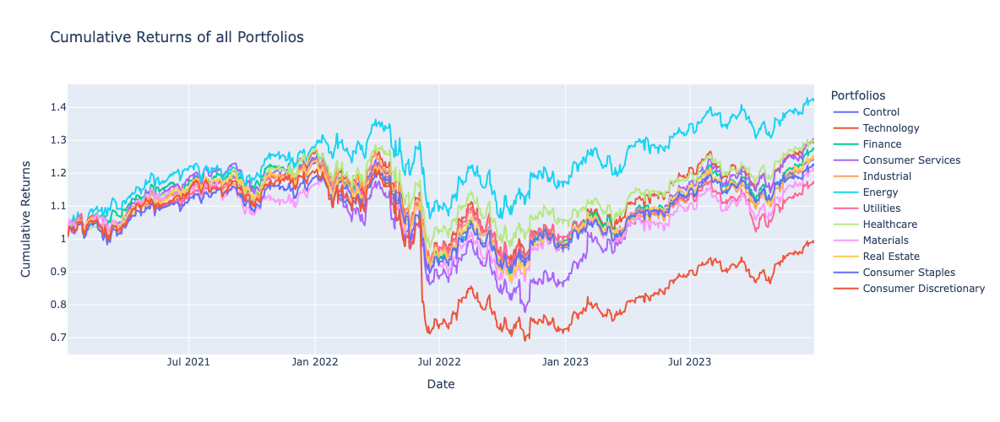

In [67]:
# Line plot for cumulative returns
hist_cumulative_returns_fig = px.line(all_cumulative_returns_df, width=800, height=500, title="Cumulative Returns of all Portfolios", labels={ 'variable': 'Portfolios', 'value': 'Cumulative Returns'})
hist_cumulative_returns_fig.show()

### With hvPlot

In [68]:
# Line plot for cumulative returns using hvplot
hist_cumulative_returns_plot = all_cumulative_returns_df.hvplot.line(
    width=800,
    height=500,
    title="Cumulative Returns of All Portfolios",
    xlabel="Date",
    ylabel="Cumulative Returns",
    legend='top_left'
)
hist_cumulative_returns_plot

/Users/jordanromnes/anaconda3/lib/python3.11/site-packages/panel/io/notebook.py:178: BokehUserWarning:

out of range integer may result in loss of precision

/Users/jordanromnes/anaconda3/lib/python3.11/site-packages/panel/io/notebook.py:178: BokehUserWarning:

out of range integer may result in loss of precision



:NdOverlay   [Variable]
   :Curve   [Date]   (value)

## Portfolios Historic Values with an Initial Investment of $20,000 at start of data

### With Plotly

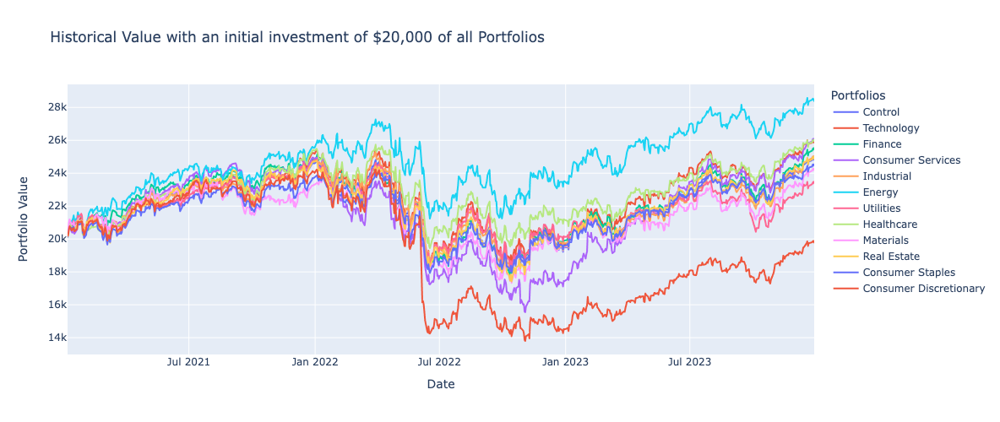

In [69]:
historical_values_fig = px.line(all_historical_values_df, width=800, height=500, title="Historical Value with an initial investment of $20,000 of all Portfolios", labels={ 'value': 'Portfolio Value',  'variable': 'Portfolios'})
historical_values_fig.show()

### With hvPlot

In [70]:
# Line plot for Historical Value
all_historical_values_df.hvplot.line(
    width=800,
    height=500,
    title="Historical Value with an initial investment of $20,000 of all Portfolios",
    xlabel="Date",
    ylabel="Portfolio Value",
    legend='top_left'
)

/Users/jordanromnes/anaconda3/lib/python3.11/site-packages/panel/io/notebook.py:178: BokehUserWarning:

out of range integer may result in loss of precision

/Users/jordanromnes/anaconda3/lib/python3.11/site-packages/panel/io/notebook.py:178: BokehUserWarning:

out of range integer may result in loss of precision



:NdOverlay   [Variable]
   :Curve   [Date]   (value)

## Historic 3 year Daily Returns

### With Plotly

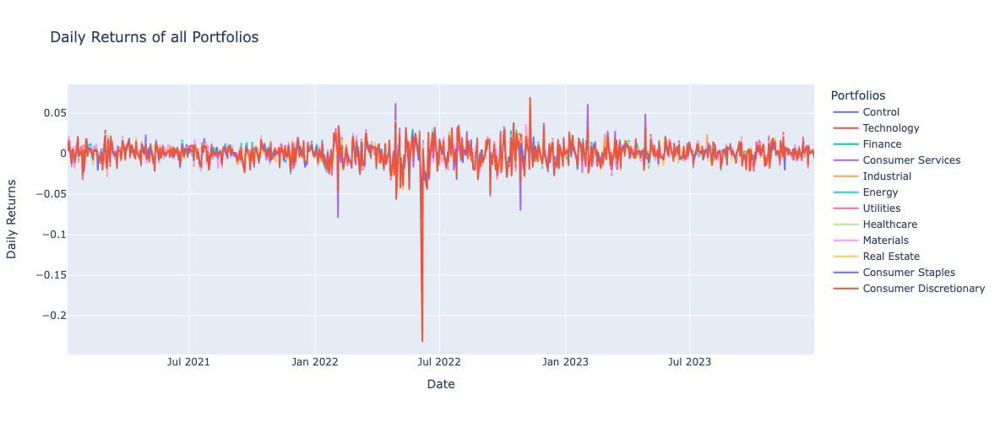

In [71]:
hist_daily_returns_fig = px.line(all_daily_returns_df, width=800, height=500, title="Daily Returns of all Portfolios", labels={ 'variable': 'Portfolios', 'value':'Daily Returns'})
hist_daily_returns_fig.show()

### With hvPlot

In [72]:
# Line plot for daily returns
all_daily_returns_df.hvplot.line(
    width=800,
    height=500,
    title="Daily Returns of all Portfolios",
    xlabel="Date",
    ylabel="Daily Returns",
    legend='top_left'
)

/Users/jordanromnes/anaconda3/lib/python3.11/site-packages/panel/io/notebook.py:178: BokehUserWarning:

out of range integer may result in loss of precision

/Users/jordanromnes/anaconda3/lib/python3.11/site-packages/panel/io/notebook.py:178: BokehUserWarning:

out of range integer may result in loss of precision



:NdOverlay   [Variable]
   :Curve   [Date]   (value)

## Box plot for risk created with Historic 3 year Cumulative Returns

### With Plotly

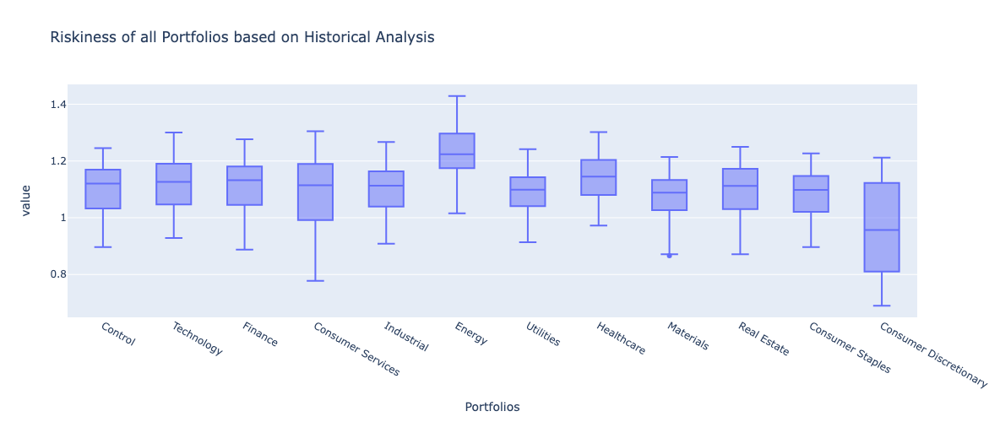

In [73]:
hist_risk_fig = px.box(all_cumulative_returns_df, width=800, height=500, title='Riskiness of all Portfolios based on Historical Analysis', labels={ 'variable': 'Portfolios'})
hist_risk_fig.show()

### With hvPlot

In [77]:
# Create a box plot for each portfolio
box_plots = []
for column in all_cumulative_returns_df.columns:
    box_plot = all_cumulative_returns_df[column].hvplot.box(height=400, width=600, title='Riskiness of all Portfolios based on Historical Analysis', legend=True)
    box_plots.append(box_plot)

# Combine all box plots into a single plot
combined_plot = box_plots[0]
for plot in box_plots[1:]:
    combined_plot += plot

# Show the combined plot
combined_plot

:Layout
   .BoxWhisker.I    :BoxWhisker   (Control)
   .BoxWhisker.II   :BoxWhisker   (Technology)
   .BoxWhisker.III  :BoxWhisker   (Finance)
   .BoxWhisker.IV   :BoxWhisker   (Consumer Services)
   .BoxWhisker.V    :BoxWhisker   (Industrial)
   .BoxWhisker.VI   :BoxWhisker   (Energy)
   .BoxWhisker.VII  :BoxWhisker   (Utilities)
   .BoxWhisker.VIII :BoxWhisker   (Healthcare)
   .BoxWhisker.IX   :BoxWhisker   (Materials)
   .BoxWhisker.X    :BoxWhisker   (Real Estate)
   .BoxWhisker.XI   :BoxWhisker   (Consumer Staples)
   .BoxWhisker.XII  :BoxWhisker   (Consumer Discretionary)

## Box plot for Potential Portfolio Values from 5 Year Monte Carlo Simulation with an initial investment of $20,000

In [ ]:
initial_investment = 20000

# Multiplying the 95% CI by the initial investment to determine potential range of portfolio values
all_mc_summary_stats['95% CI Lower'] *= initial_investment
all_mc_summary_stats['95% CI Upper'] *= initial_investment

### With Plotly

In [ ]:
# Create a box plot
mc_risk_fig = px.box(
    all_mc_summary_stats,
    x=['95% CI Lower', '95% CI Upper'],
    y='Portfolio',
    color='Std',
    title='Potential Portfolio Values from 5 Year Monte Carlo Simulation with an initial investment of $20,000',
    labels={'value': 'Portfolio Value', 'variable': 'CI Bound', 'standard_deviation': 'Standard Deviation', 'portfolio': 'Portfolios'},
    width=900, 
    height=700
)

# Sort the box plot by standard deviation
mc_risk_fig.update_layout(
    yaxis=dict(categoryorder='total ascending'),  # Sort by standard deviation in ascending order
    legend=dict(title='Standard Deviation', traceorder='normal')  # Sort the legend by standard deviation
)

# Adding a vertical line to show initial investment
mc_risk_fig.add_shape(
    go.layout.Shape(
        type='line',
        x0=20000,
        x1=20000,
        y0=-1,
        y1=12,
        line=dict(color='black', width=2),
    )
)
# Adding a label to the vertical line
mc_risk_fig.update_layout(
    annotations=[
        go.layout.Annotation(
            x=20000,
            y=1,
            xref="x",
            yref="paper",
            text="Initial Investment",
            showarrow=True,
            arrowhead=4,
            ax=0,
            ay=-30
        )
    ]
)


# Show the plot
mc_risk_fig.show()